In [1]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

import pandas as pd
import os

#### Load Data

We are going to load in the data that is stored as csv

In [20]:
# List of local file paths
file_paths = [
    "../data/processed/Buffalo_workload.csv",
    "../data/processed/Boston_workload.csv",
    "../data/processed/Miami_workload.csv",
    "../data/processed/Oakland_workload.csv",
    "../data/processed/Washington_workload.csv"
]

# List to store each DataFrame
dataframes = []

# Loop over each file and load into a DataFrame
for file_path in file_paths:
    try:
        # Load the content into a DataFrame
        df = pd.read_csv(file_path)
        
        # Extract city name from the file path
        city_name = file_path.split("/")[-1].split("_")[0].capitalize()  # Capitalize city name

        # Add a new column for the city name
        df["city"] = city_name

        # Append the DataFrame to the list
        dataframes.append(df)
        
    except Exception as e:
        print(f"Failed to process the file '{file_path}': {e}")

# Concatenate all DataFrames into one
merged_df = pd.concat(dataframes)

merged_df['date'] = pd.to_datetime(merged_df['date'])


# Preview the merged DataFrame
print("Merged DataFrame Preview:")
print(merged_df.head())



Merged DataFrame Preview:
        date                           department  count     city
0 2014-01-02                      Dept of Parking   14.0  Buffalo
1 2014-01-02                 Dept of Public Works  170.0  Buffalo
2 2014-01-02                                 DPIS   29.0  Buffalo
3 2014-01-02                            Utilities   16.0  Buffalo
4 2014-01-02  Buffalo Municipal Housing Authority    2.0  Buffalo


In [21]:
print(len(merged_df.groupby(['city','department'])), "unique combinations of city and department")

114 unique combinations of city and department


### Exploring the seasonality of city level data

At the city level, the magnitude of the seasonality plots is generally less than the magnitude of the trends and residuals plots, indicating that seasonality may not be a big factor.

Miami, Oakland, and Boston all seem to have a constantly increasing number of tickets, which they don't tend to mark closed (this may be a data collection/process issue), so it is not surprising that any seasonal trends are lost in the noise.

Buffalo and Washington show more fluctuation as they open and close tickets, and the magnitude of Buffalo's seasonality is closer to that of the trends and residuals.

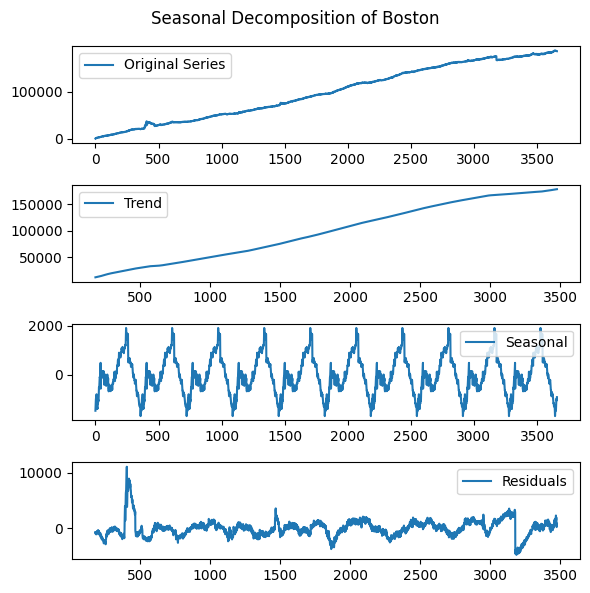

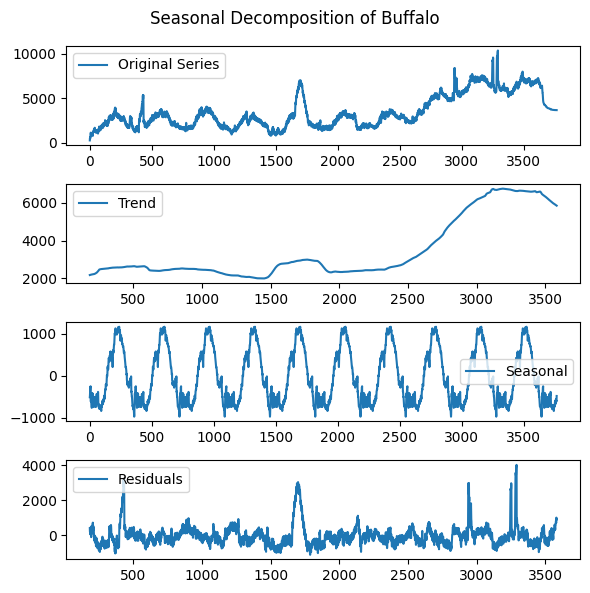

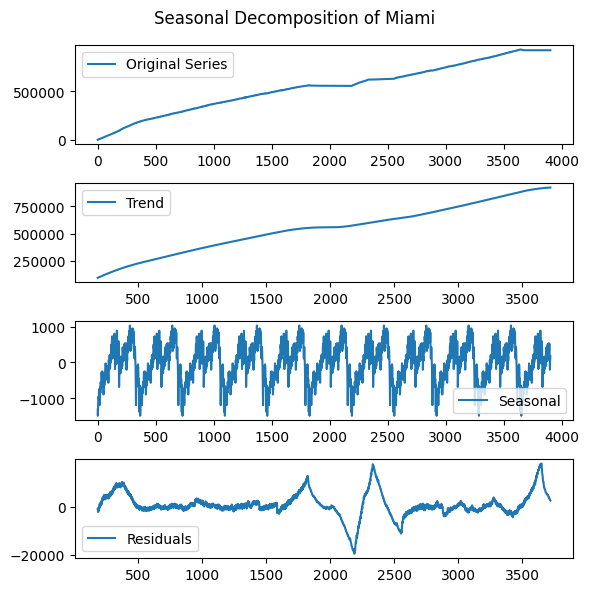

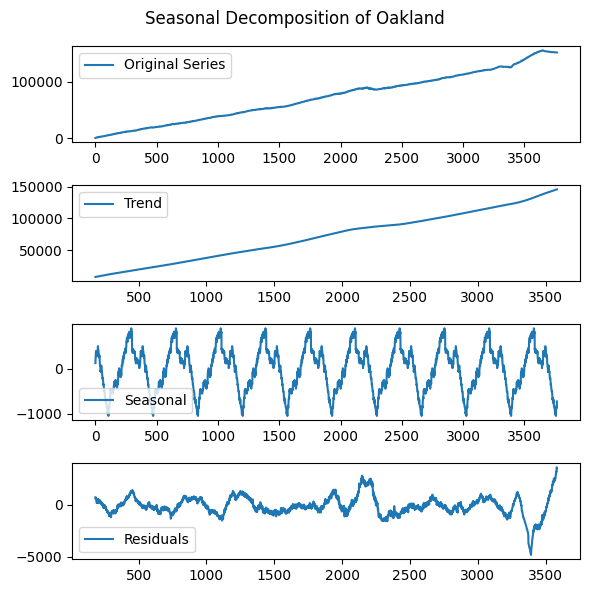

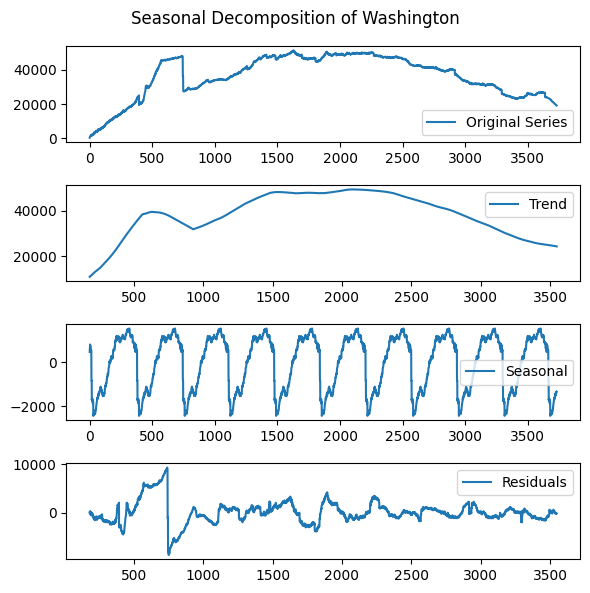

In [3]:
for city, city_df in merged_df.groupby("city"):
    # Perform seasonal decomposition on city level summary data
    df = city_df.groupby("date")["count"].sum().reset_index()
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {city}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


### Buffalo Seasonality Plots by Department

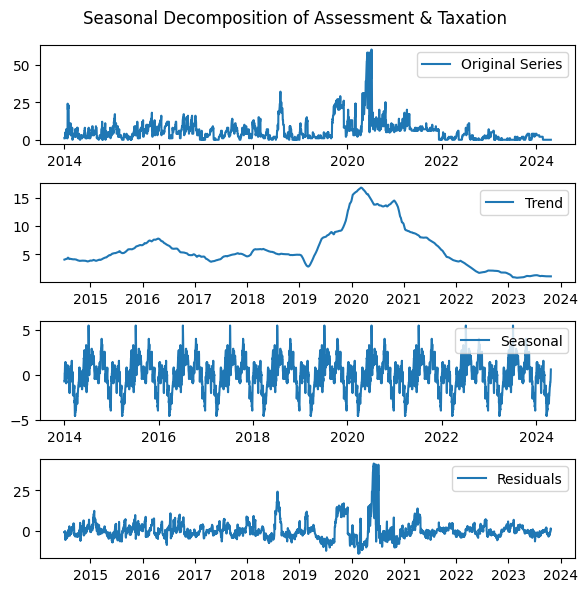

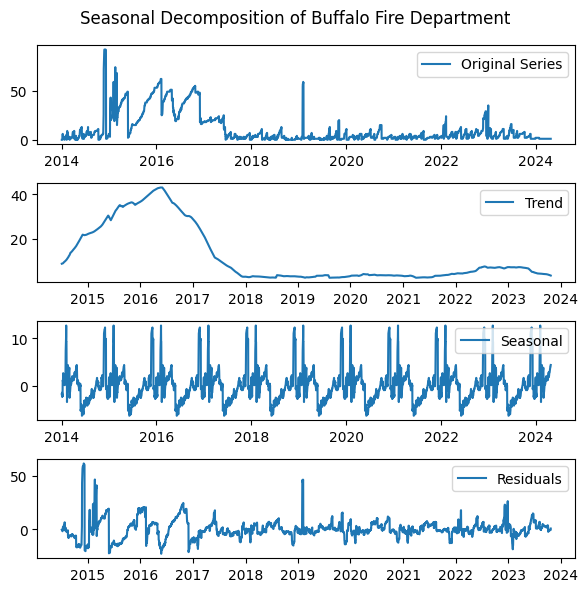

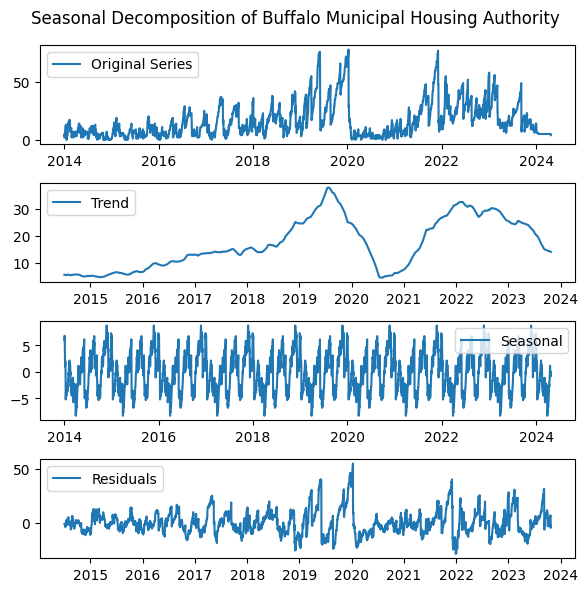

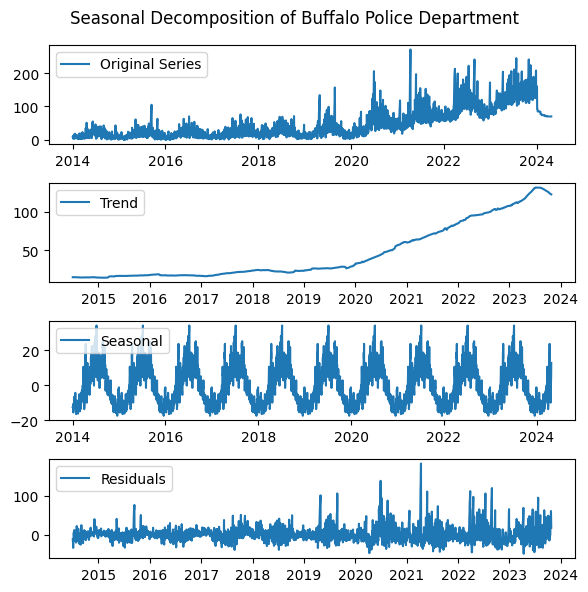

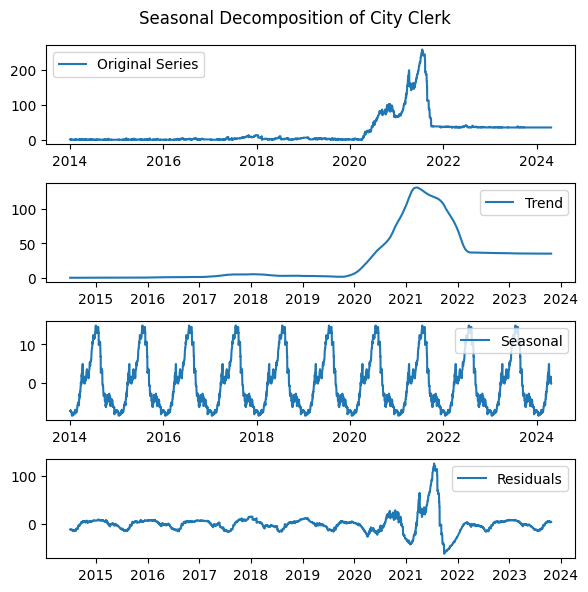

...

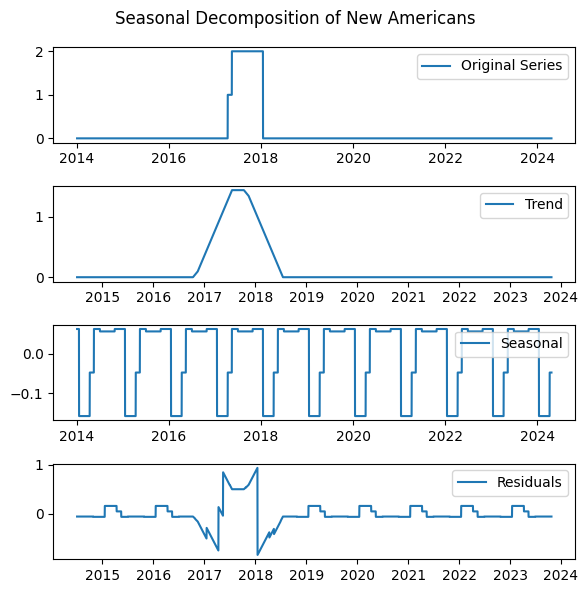

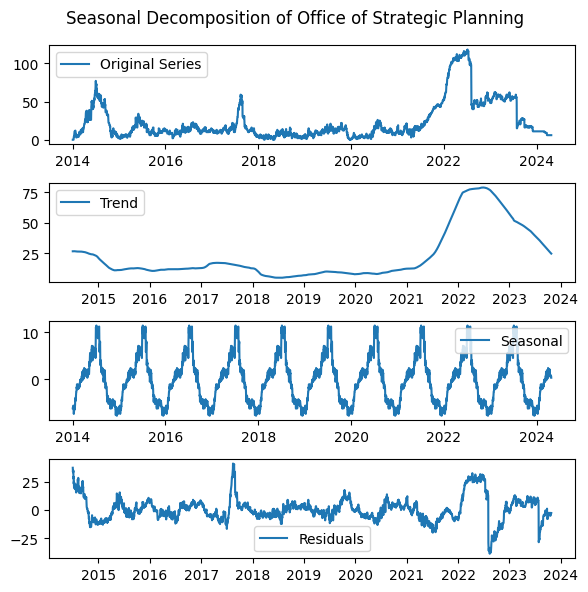

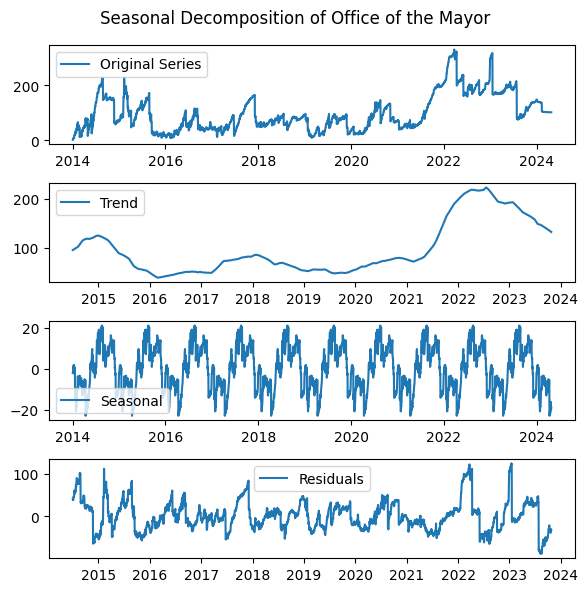

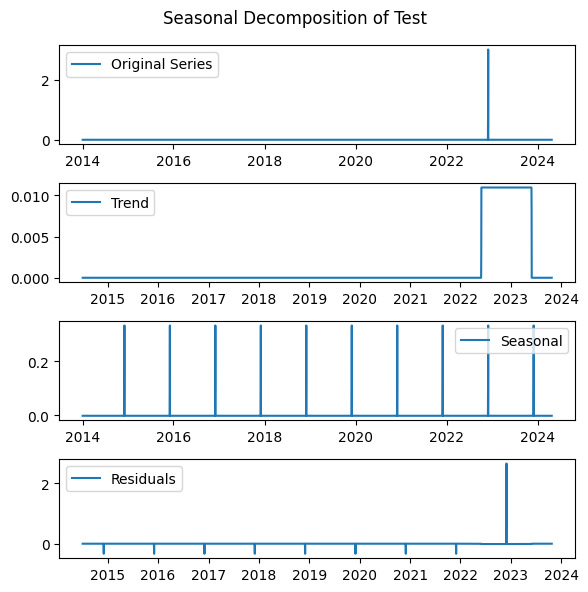

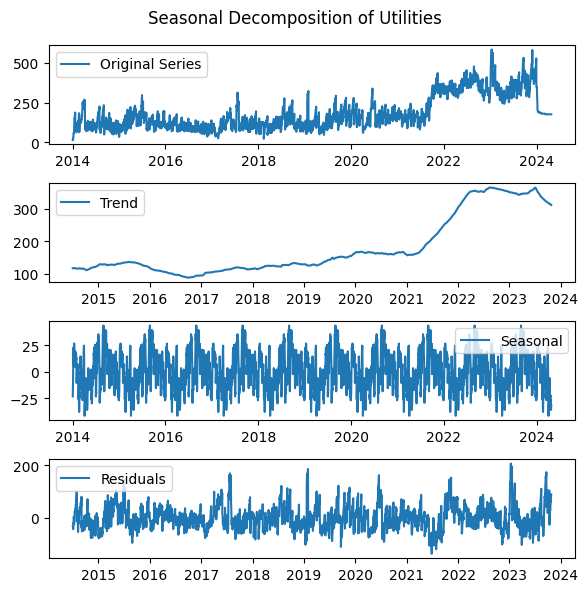

In [4]:
buffalo = merged_df[merged_df['city'] == 'Buffalo']
for dept, df in buffalo.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


#### Determining which departments to drop

In [78]:
buff_raw =pd.read_csv(
    f"../data/raw/buffalo_cleaned.csv",
    parse_dates=['open_date','close_date'],
)

buff_raw['department'].value_counts()

department
Dept of Public Works                   514105
DPIS                                   121608
Dept of Parking                         50416
Buffalo Police Department               42426
Utilities                               40368
Office of the Mayor                      6190
Dept of Law                              4663
Buffalo Municipal Housing Authority      2698
Office of Strategic Planning             2695
Assessment & Taxation                    1827
Buffalo Fire Department                  1317
City Clerk                               1019
Community Services & Rec. Program.         59
Human Resources                            19
Test                                        4
New Americans                               2
Management Information Systems              2
Name: count, dtype: int64

Dropping those with very few and infrequent requests.

In [22]:
drop_depts = ['Human Resources','Test','New Americans', 'Management Information Systems','Community Services & Rec. Program.']

merged_df.drop(merged_df.index[(merged_df['city']=='Buffalo')&(merged_df['department'].isin(drop_depts))],inplace=True)

#### Miami Seasonality Plots by department

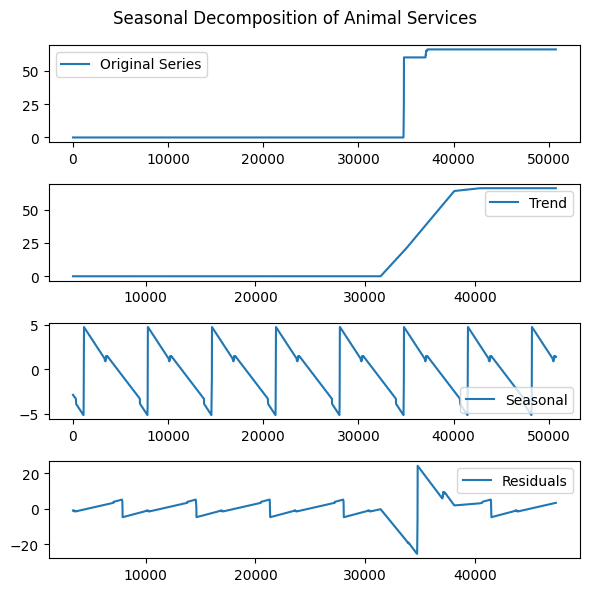

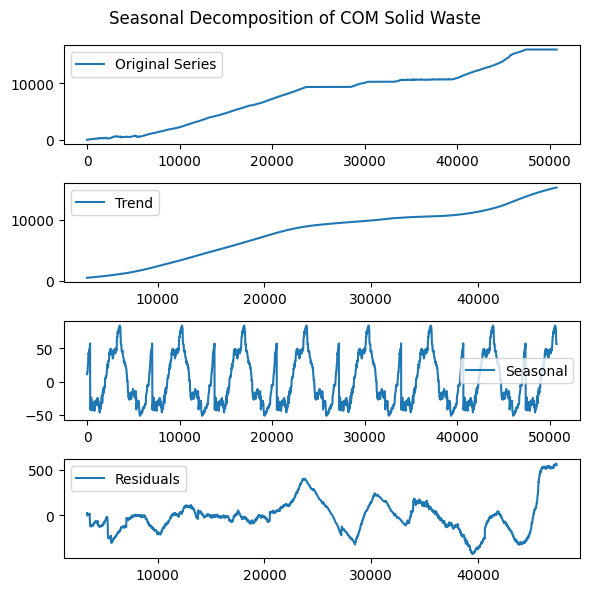

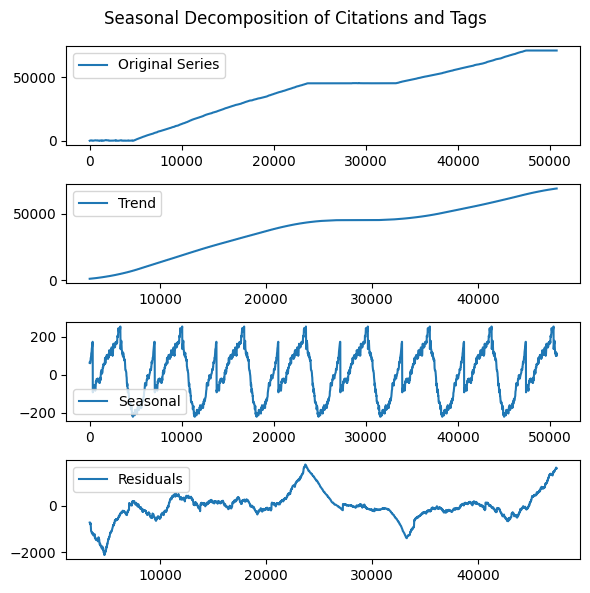

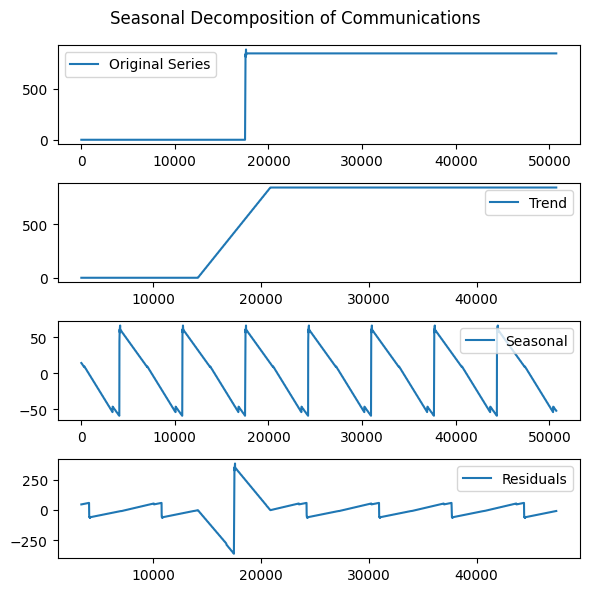

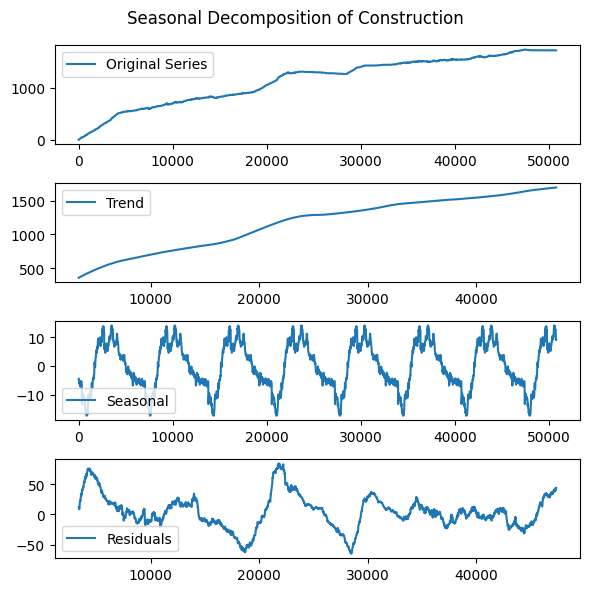

...

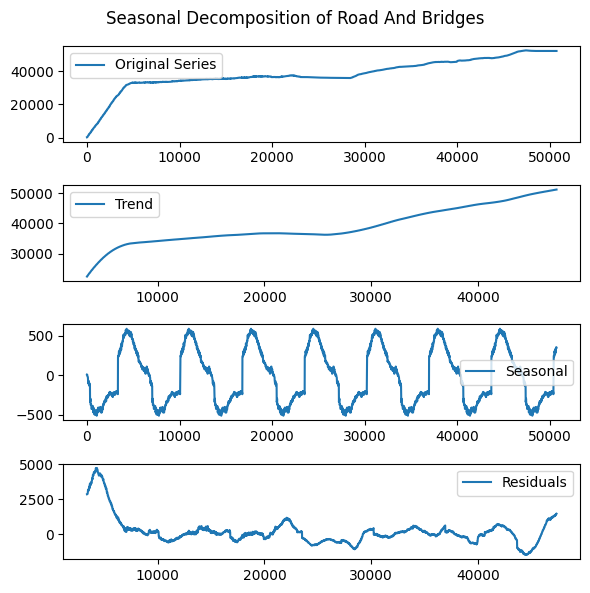

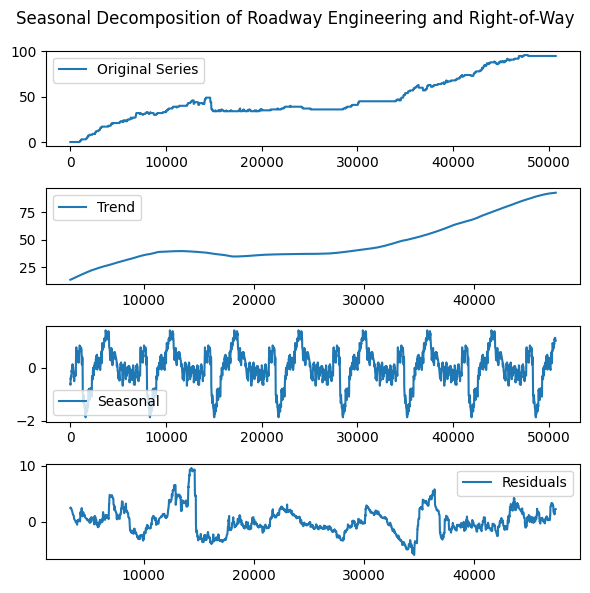

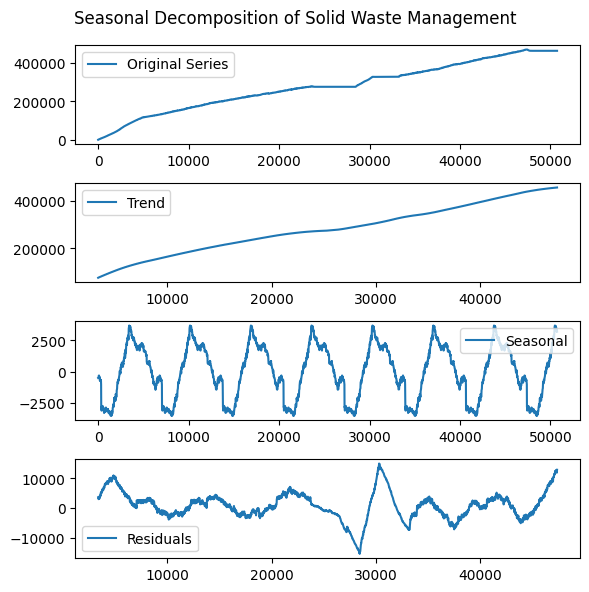

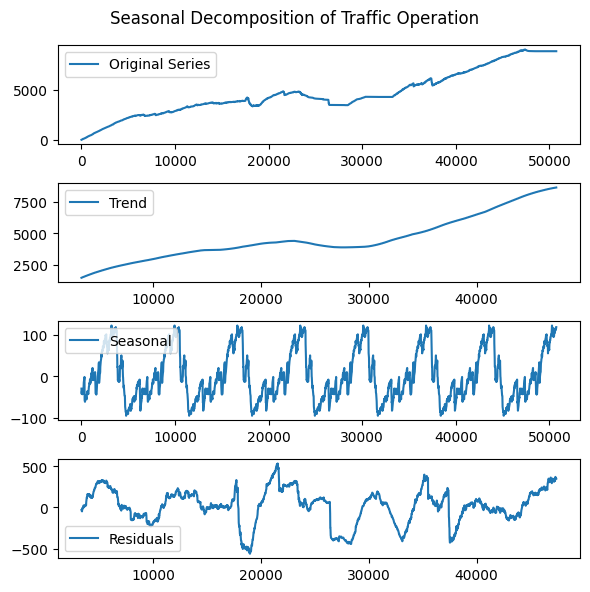

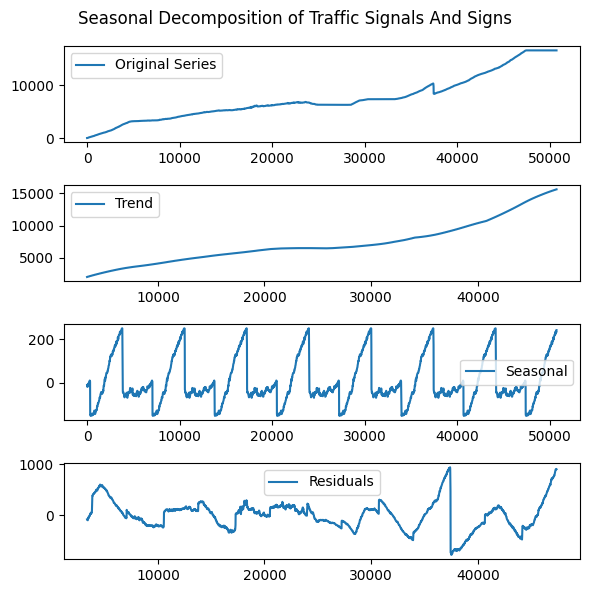

In [24]:
mia = merged_df[merged_df['city'] == 'Miami']
for dept, df in mia.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [25]:
mia_raw = pd.DataFrame()
for i in range(1,3):
    mia_raw = pd.concat([mia_raw, pd.read_csv(
        f"../data/raw/miami_cleaned_{i}.csv",
        parse_dates=['open_date','close_date'],
    )])

mia_raw['department'].value_counts()

department
Solid Waste Management                  1648506
Enforcement Section                      236267
Regulatory and Economic Resources        200558
Road And Bridges                         158034
Citations and Tags                        87441
RAAM                                      54514
Traffic Signals And Signs                 35012
Traffic Operation                         32569
COM Solid Waste                           22500
Construction                               3847
Communications                             2416
Roadway Engineering and Right-of-Way        200
Animal Services                              66
Name: count, dtype: int64

Dropping those with very few requests, and also communications, which appears to have been all dumped into the system at once.

In [26]:
drop_depts = ['Communications','Roadway Engineering and Right-of-Way','Animal Services']
merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Miami')&(merged_df['department'].isin(drop_depts))])

### Boston Seasonality Plots by Department

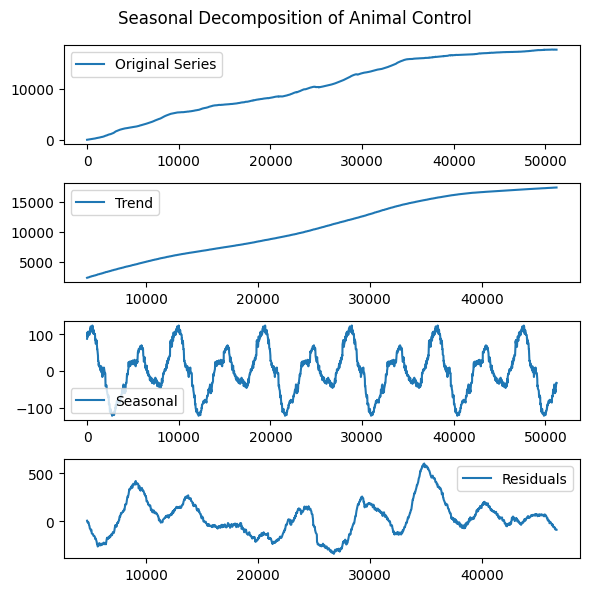

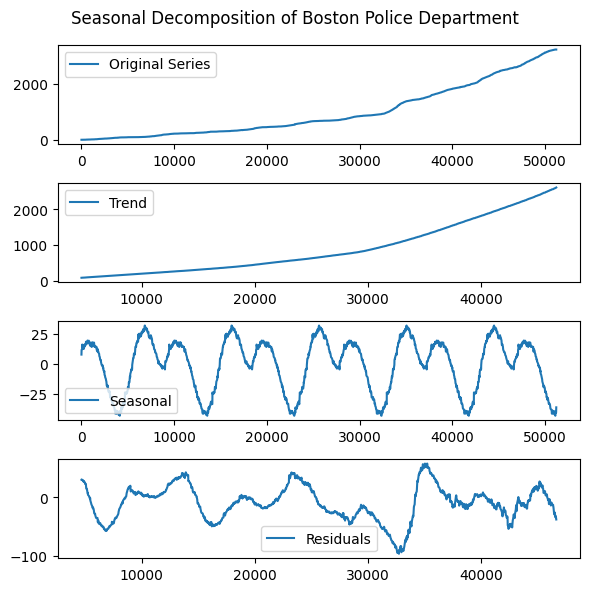

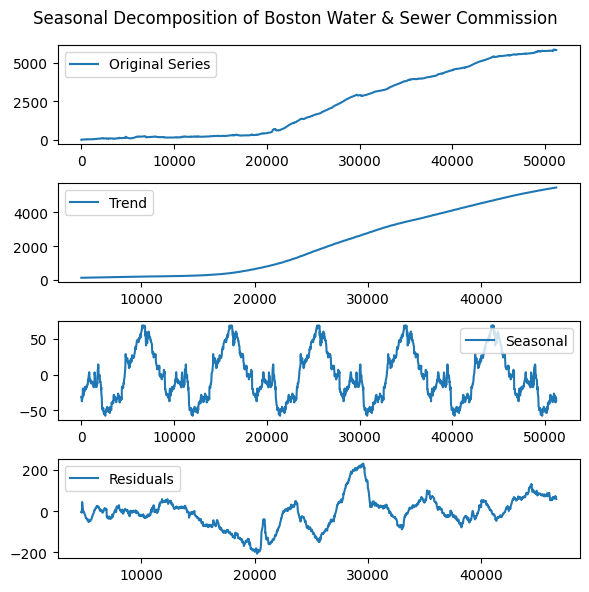

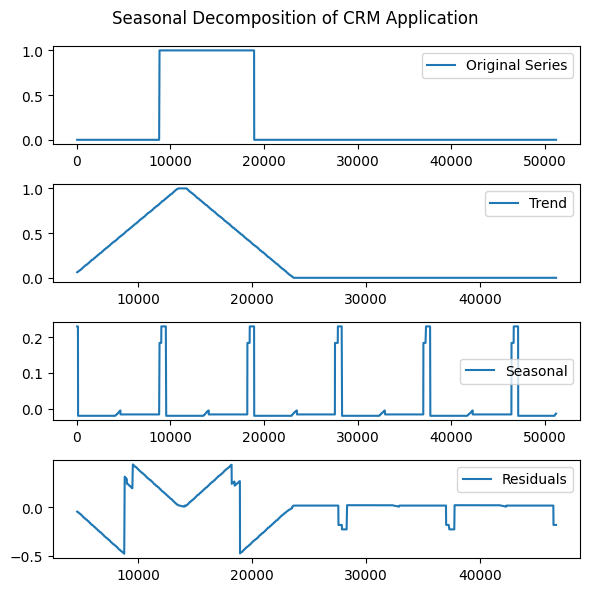

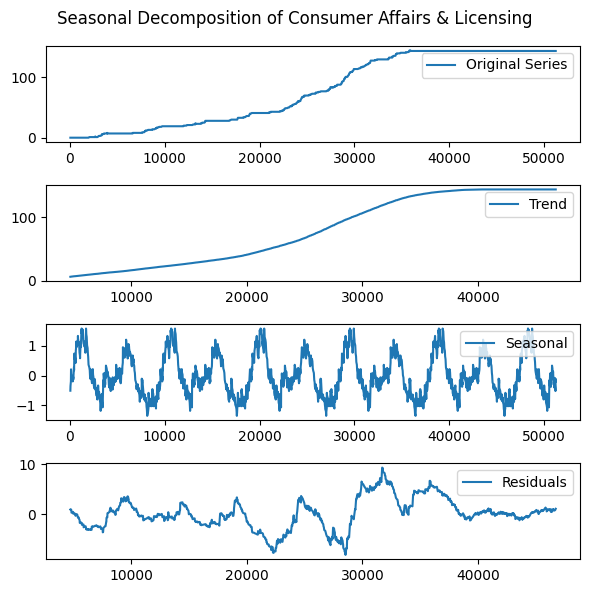

...

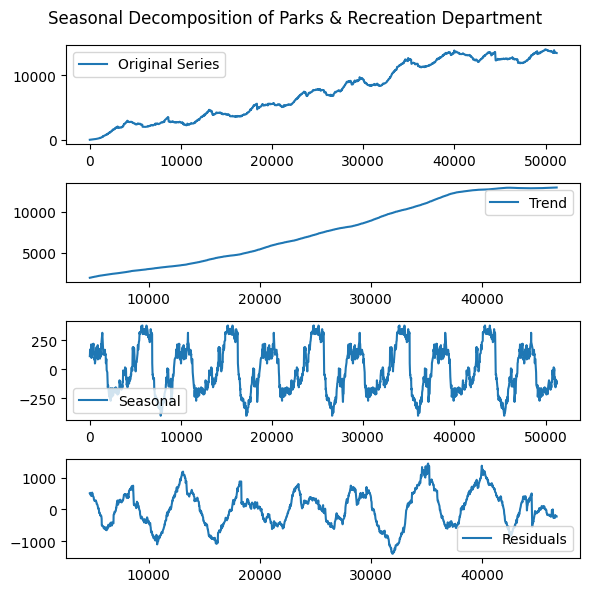

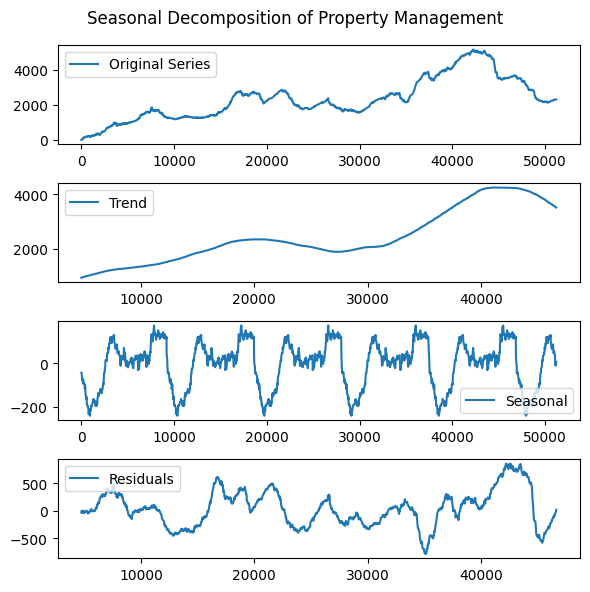

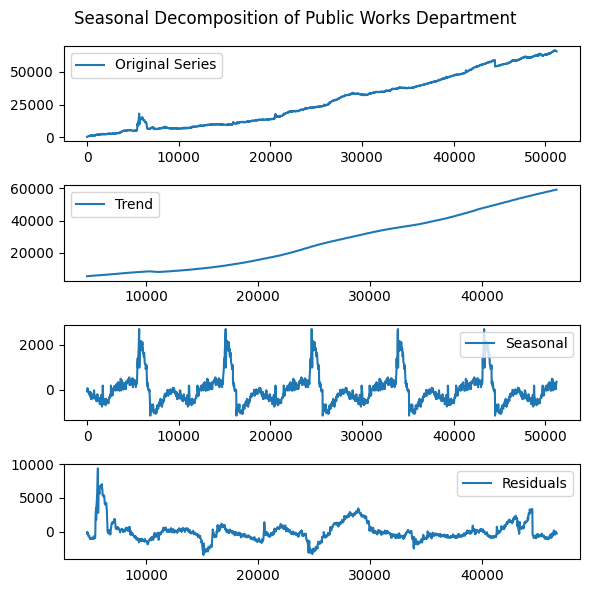

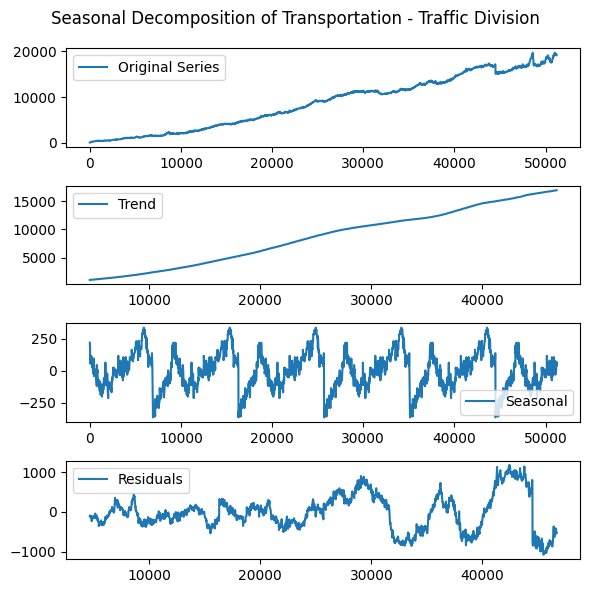

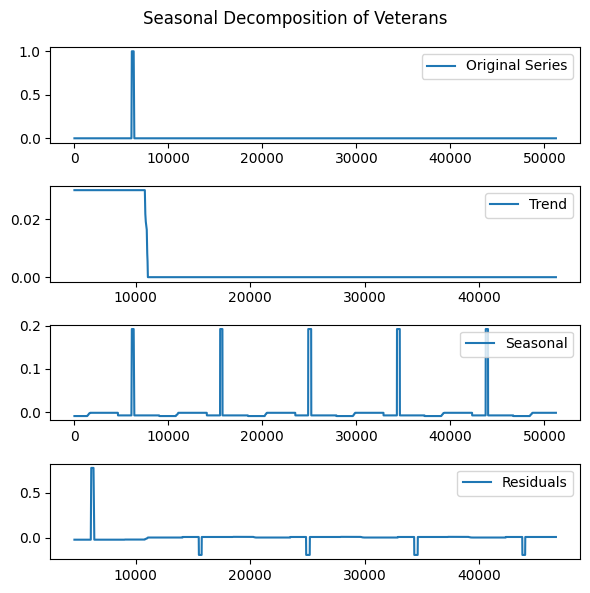

In [27]:
bos = merged_df[merged_df['city'] == 'Boston']
for dept, df in bos.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [28]:
bos_raw = pd.DataFrame()
for i in range(1,3):
    bos_raw = pd.concat([bos_raw, pd.read_csv(
        f"../data/raw/boston_cleaned_{i}.csv",
        parse_dates=['open_date','close_date'],
    )])

bos_raw['department'].value_counts()

department
Public Works Department              1354539
Transportation - Traffic Division     544954
Inspectional Services                 210856
Parks & Recreation Department         154013
Mayor's 24 Hour Hotline               106960
Property Management                    36703
Animal Control                         33945
Boston Water & Sewer Commission        13980
Boston Police Department                3659
Disability Department                   2112
Neighborhood Services                    271
Consumer Affairs & Licensing             152
Veterans                                   1
CRM Application                            1
Name: count, dtype: int64

Dropping those with very few requests, and disability department which hasn't been used in years

In [29]:
drop_depts = ['Disability Department','Neighborhood Services','Consumer Affairs & Licensing','Veterans','CRM Application']

merged_df = merged_df.drop(merged_df.index[(merged_df['city']=='Boston')&(merged_df['department'].isin(drop_depts))])

### Oakland Seasonality plots by department

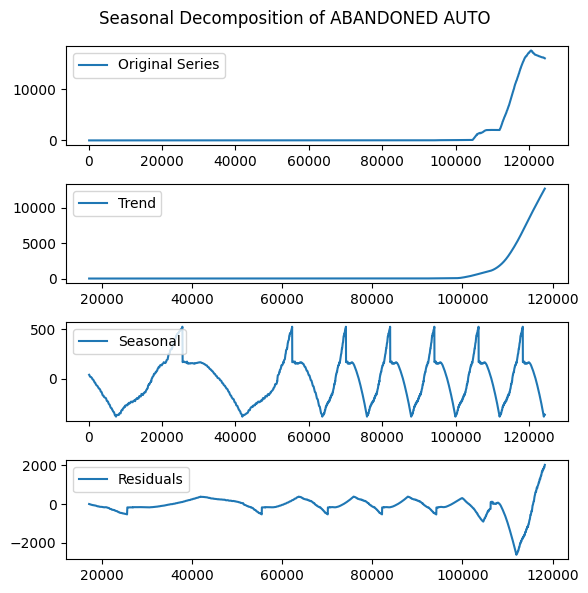

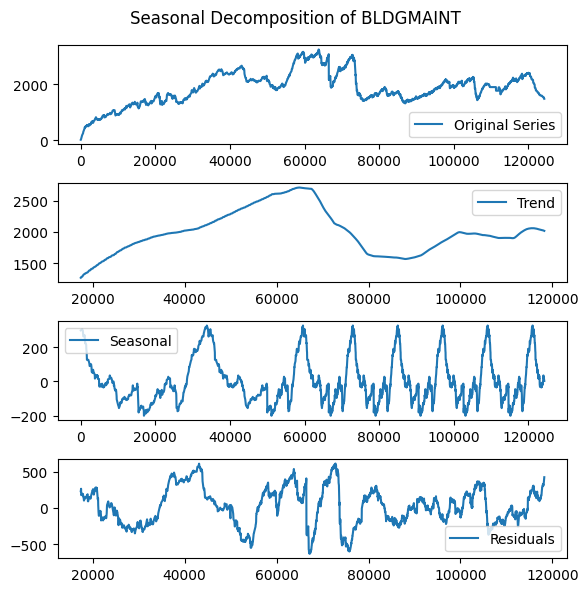

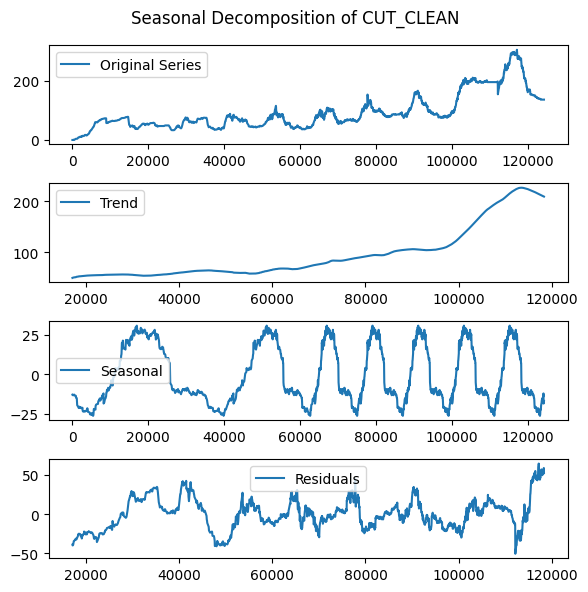

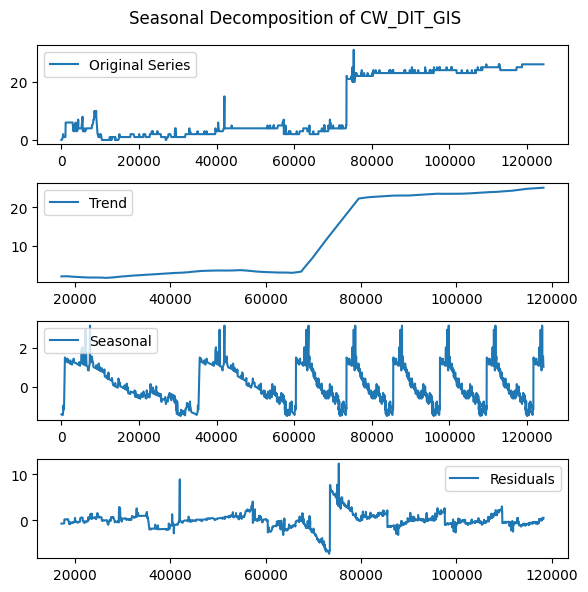

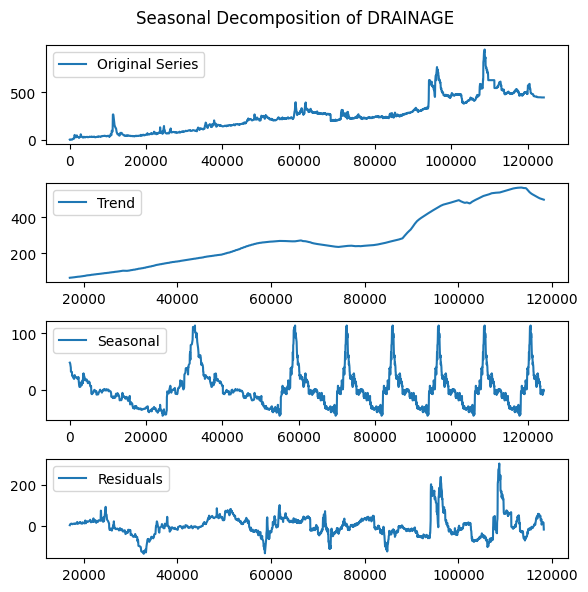

...

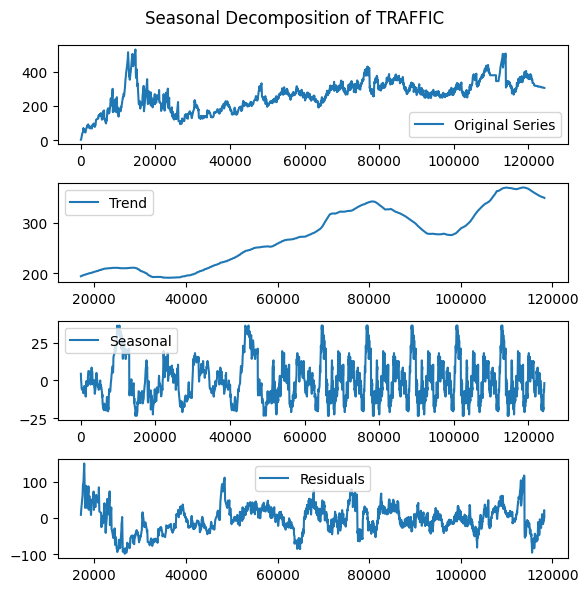

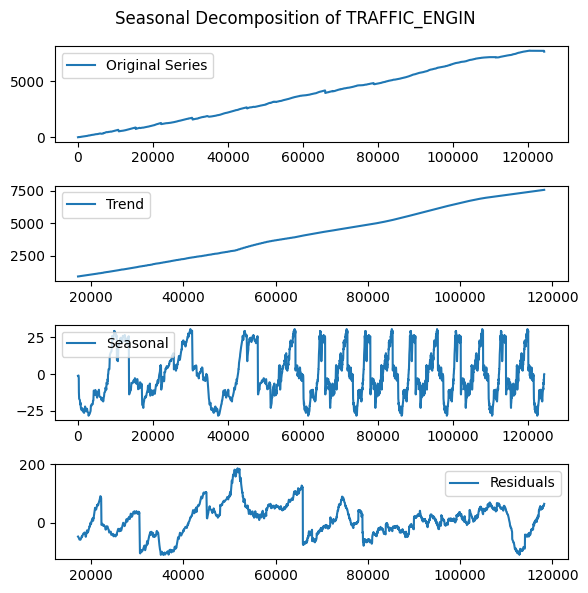

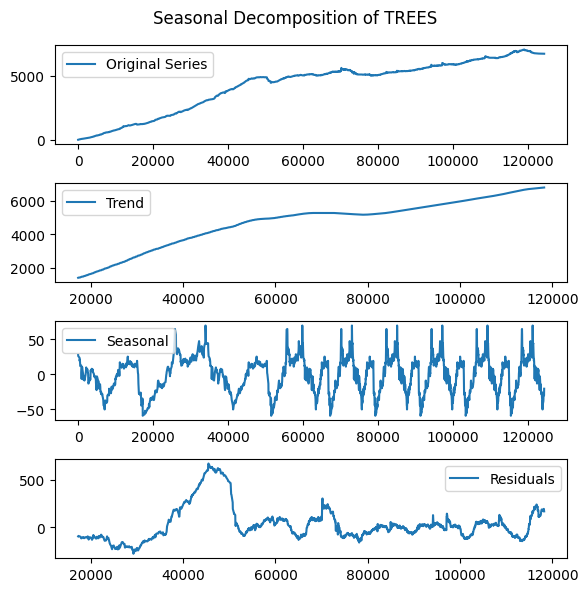

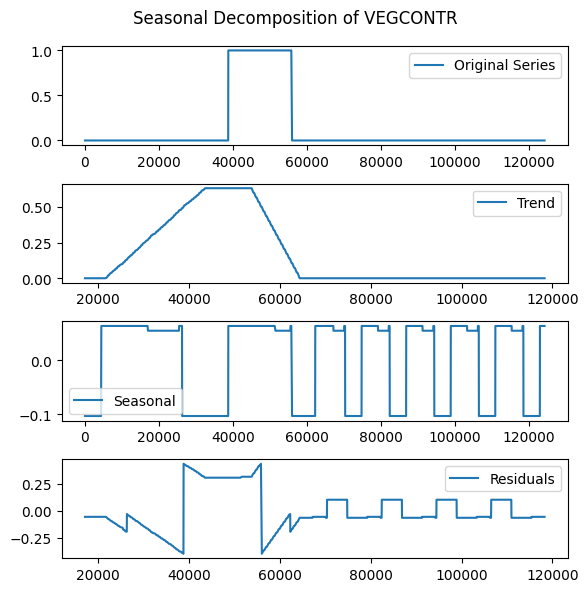

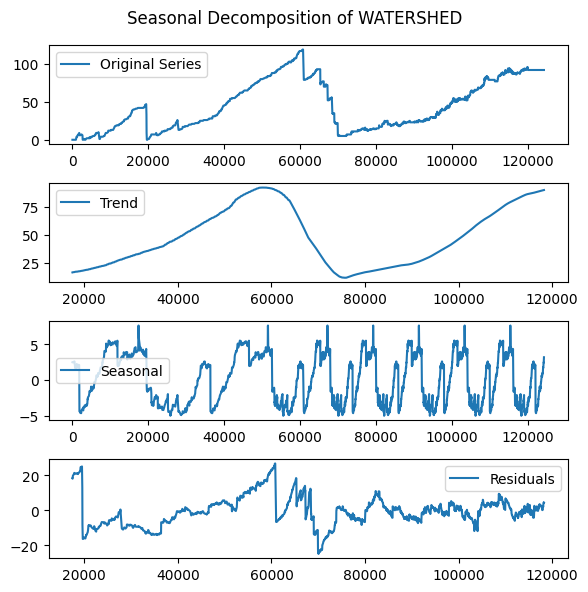

In [30]:
oak = merged_df[merged_df['city'] == 'Oakland']
for dept, df in oak.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

#### Determining which departments to drop

In [119]:
oak_raw = pd.read_csv(
        "../data/raw/oakland_cleaned.csv",
        parse_dates=['open_date','close_date'],
    )

oak_raw['department'].value_counts()

department
ILLDUMP           260235
OTHER              66697
POLICE             59573
BLDGMAINT          54674
STREETSW           33319
GRAFFITI           30376
TREES              23328
RECYCLING          22912
ELECTRICAL         20994
ABANDONED AUTO     20562
TRAFFIC            20516
PARKING            18833
PARKS              12246
DRAINAGE           11144
SEWERS             11021
TRAFFIC_ENGIN      10999
METER_REPAIR       10931
ROW_INSPECTORS      8205
KOCB                6451
ROW_STREETSW        5656
FIRE                4803
HOMELESS EMT        4204
HE_CLEAN            3792
CUT_CLEAN           2879
ROW                 1714
ENVIRON_ENF         1060
WATERSHED            522
SIDESHOWS            474
CW_DIT_GIS           352
SURVEY                11
FACILITIES            10
LAB                    1
VEGCONTR               1
Name: count, dtype: int64

### Washington Seasonality Plots by Department

RERUN AFTER DEPARTMENTS FIXED, FIGURE OUT WHICH TO DROP

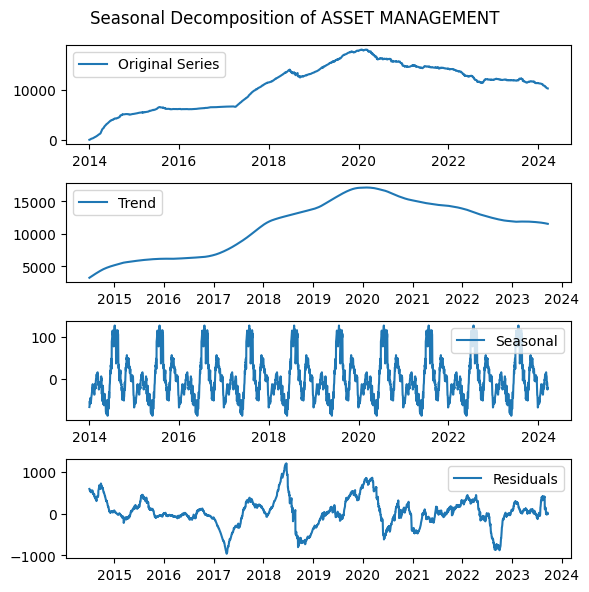

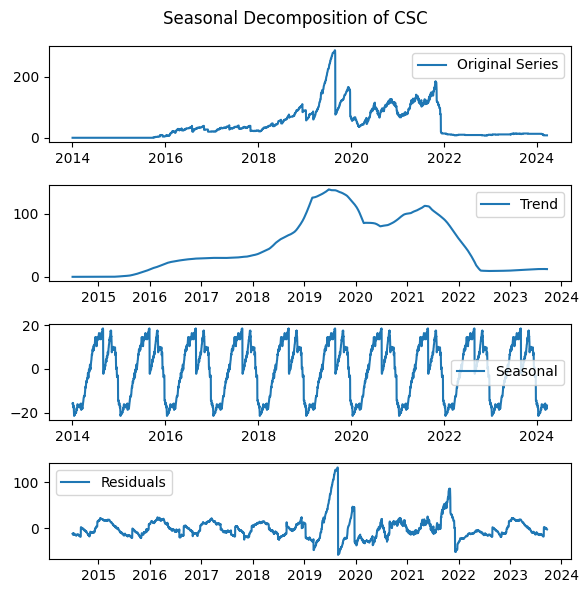

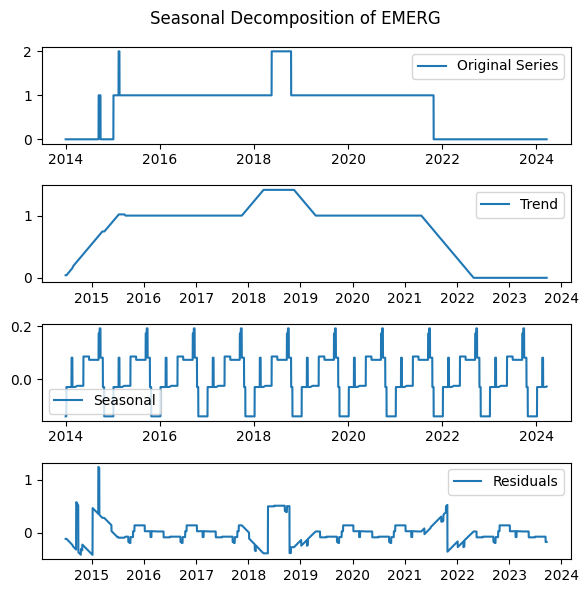

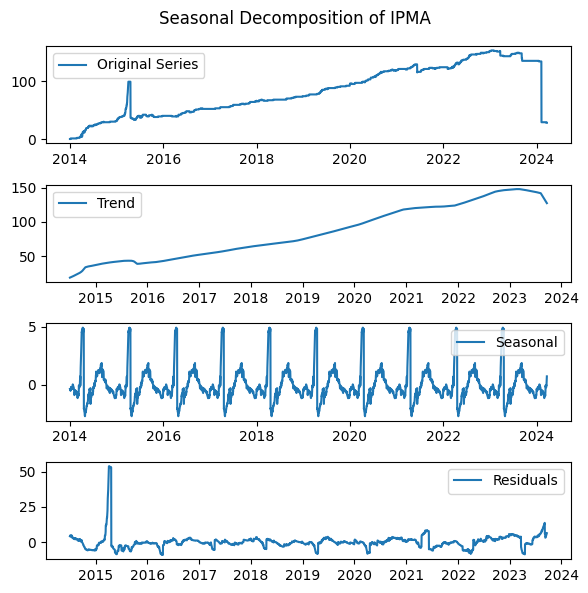

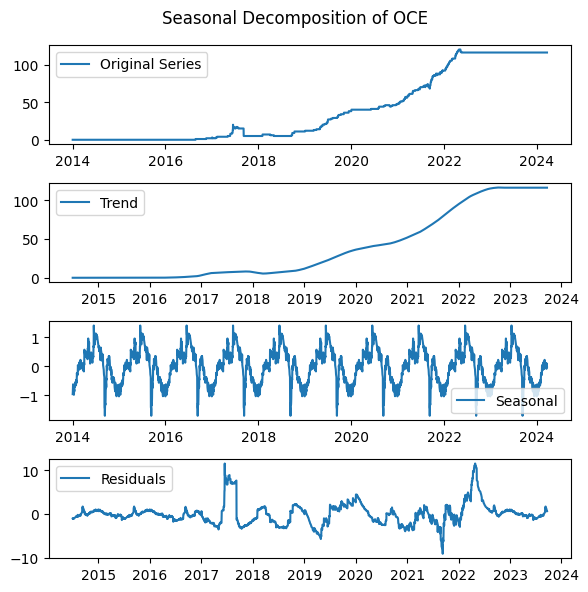

...

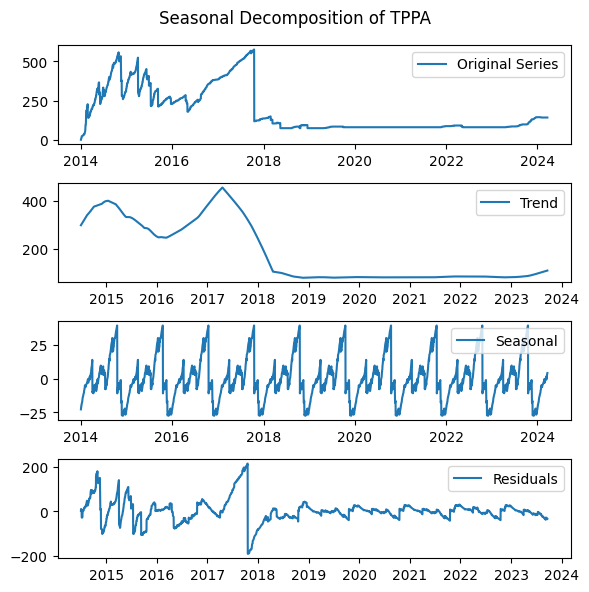

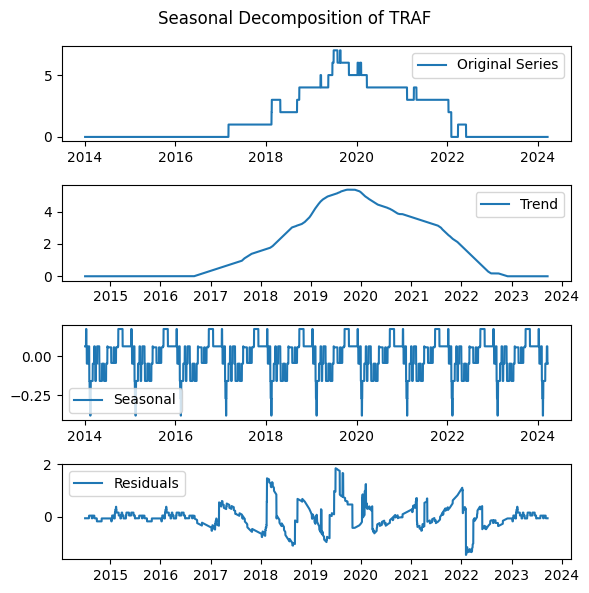

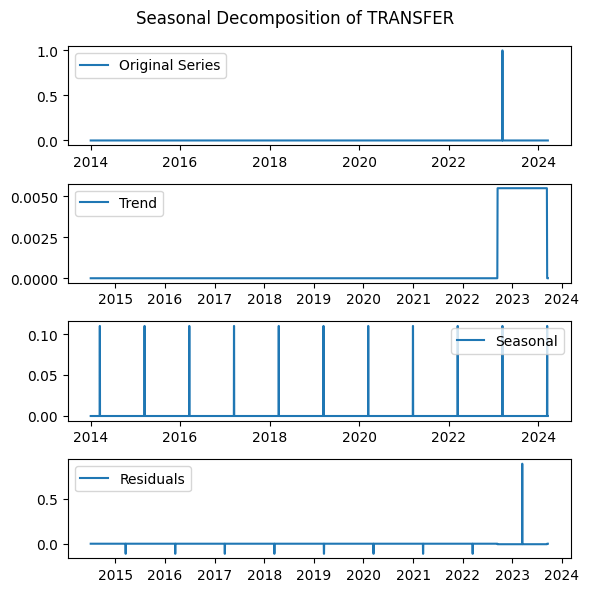

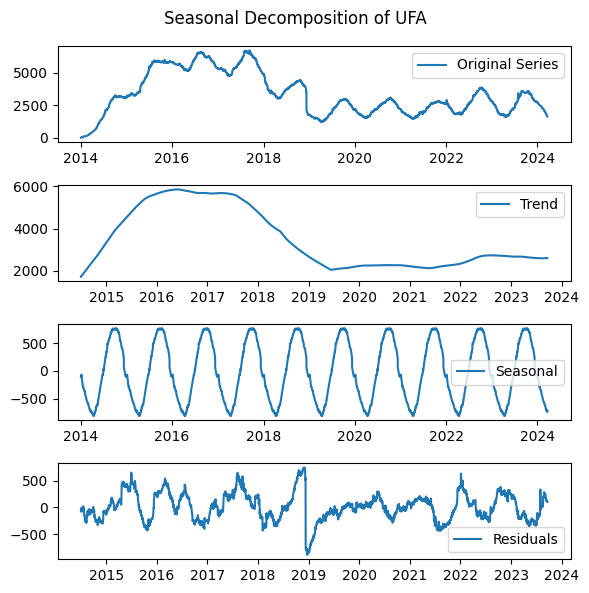

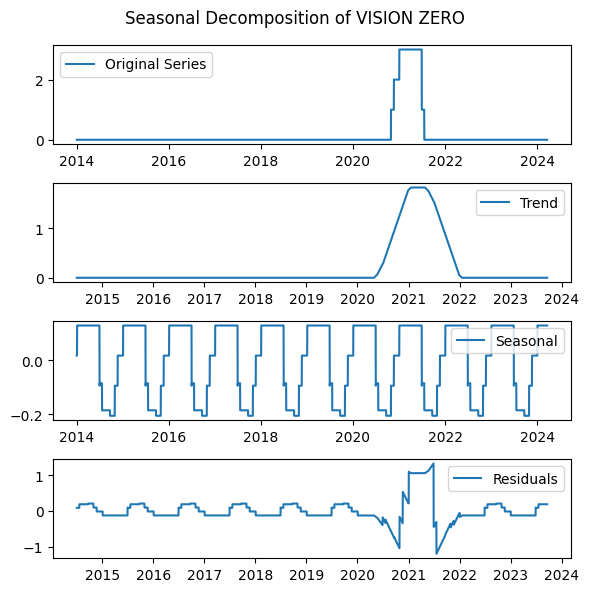

In [72]:
dc = merged_df[merged_df['city'] == 'Washington']
for dept, df in dc.groupby("department"):
    # Perform seasonal decomposition on city level summary data
    result = seasonal_decompose(df['count'], model = 'additive', period=365)
    trend = result.trend.dropna()
    seasonal = result.seasonal.dropna()
    residual = result.resid.dropna()
    # Plot the decomposition
    fig = plt.figure(figsize=(6,6))
    fig.suptitle(f"Seasonal Decomposition of {dept}")
 
    plt.subplot(4, 1, 1)
    plt.plot(df['count'], label='Original Series')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(residual, label='Residuals')
    plt.legend()
    
    plt.tight_layout()
    plt.show()


#### Exploratory Data Analysis (EDA)

In [13]:
merged_df

,department,count,city
date,,,
2014-01-02,Dept of Parking,0.0,Buffalo
2014-01-02,Dept of Public Works,0.0,Buffalo
2014-01-02,DPIS,0.0,Buffalo
2014-01-02,Utilities,0.0,Buffalo
2014-01-02,Buffalo Municipal Housing Authority,0.0,Buffalo
...,...,...,...
2024-03-20,PSRA,1.0,Washington
2024-03-20,PD,7.0,Washington
2024-03-20,VISION ZERO,0.0,Washington


Index(['date', 'count'], dtype='object')


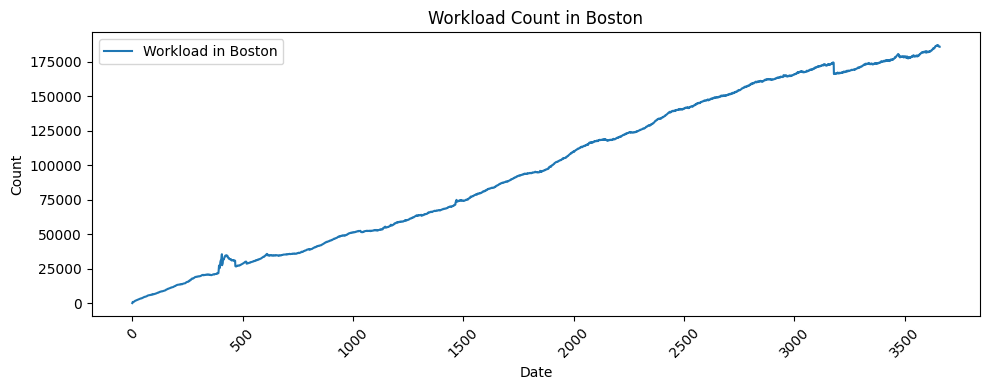

Index(['date', 'count'], dtype='object')


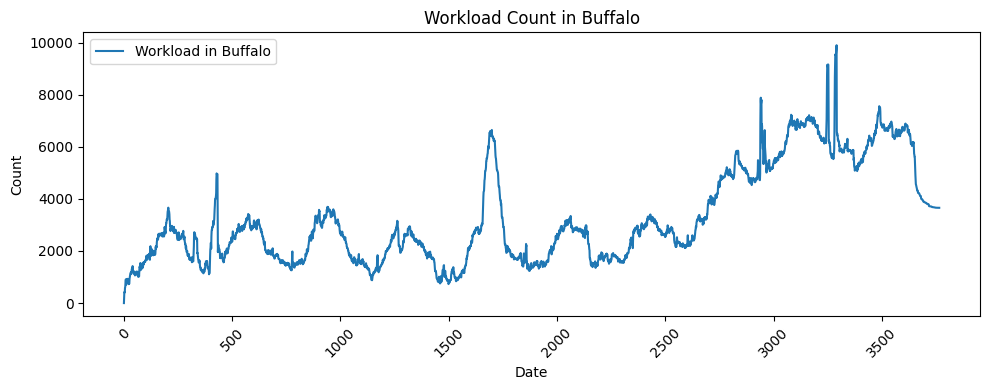

Index(['date', 'count'], dtype='object')


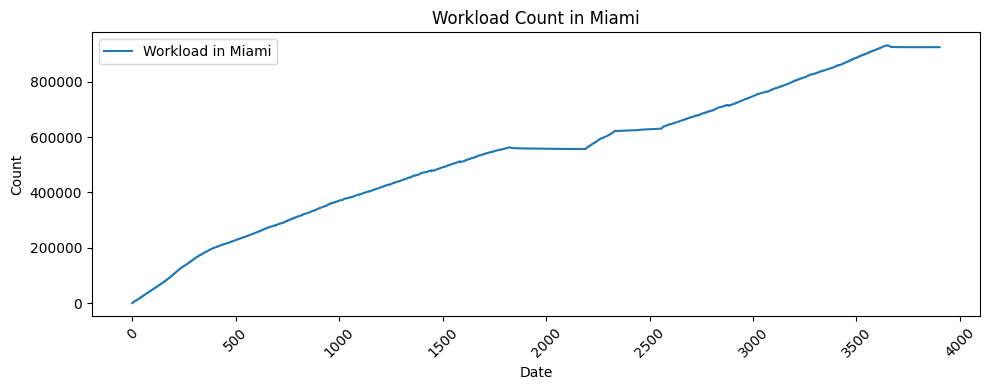

Index(['date', 'count'], dtype='object')


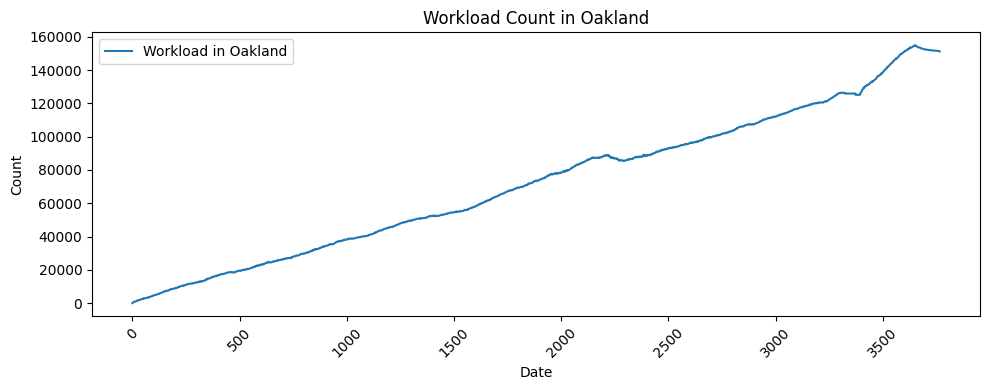

Index(['date', 'count'], dtype='object')


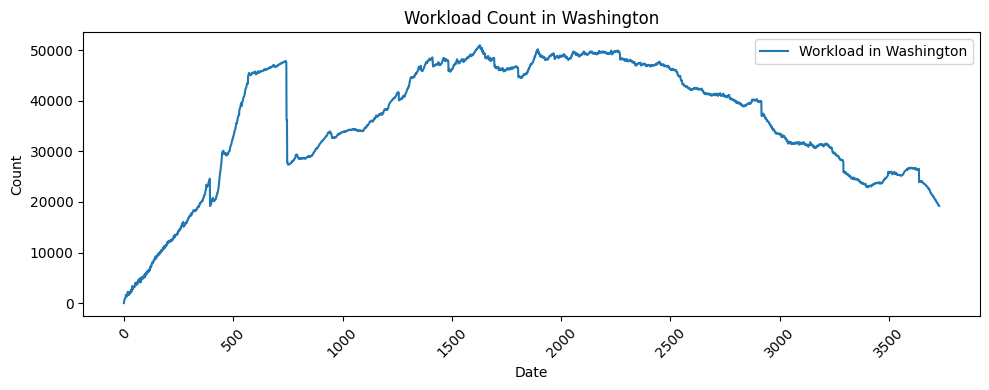

In [16]:
import matplotlib.pyplot as plt

# Visualize workload count by city
for city,city_data in merged_df.groupby('city'):
    city_data = city_data.groupby("date")['count'].sum().reset_index()
        
    plt.figure(figsize=(10, 4))
    plt.plot(city_data.index, city_data["count"], label=f"Workload in {city}")
    plt.title(f"Workload Count in {city}")
    plt.xlabel("Date")
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


### Conclusion

In [31]:
print(len(merged_df.groupby(['city','department'])), "unique combinations of city and department")

101 unique combinations of city and department
